# LightDark Demo

In [1]:
importall POMDPs
using POMDPToolbox
using Distributions
using Parameters
using Plots
using StaticArrays

# Problem Definition

In [2]:
@with_kw struct SimpleLightDark <: POMDPs.POMDP{Int,Int,Float64}
    discount::Float64       = 0.95
    correct_r::Float64      = 100.0
    incorrect_r::Float64    = -100.0
    light_loc::Int          = 10
    radius::Int             = 60
end
discount(p::SimpleLightDark) = p.discount
isterminal(p::SimpleLightDark, s::Number) = !(s in -p.radius:p.radius)

const ACTIONS = [-10, -1, 0, 1, 10]
actions(p::SimpleLightDark) = ACTIONS
n_actions(p::SimpleLightDark) = length(actions(p))
const ACTION_INDS = Dict(a=>i for (i,a) in enumerate(actions(SimpleLightDark())))
action_index(p::SimpleLightDark, a::Int) = ACTION_INDS[a]

states(p::SimpleLightDark) = -p.radius:p.radius + 1
n_states(p::SimpleLightDark) = length(states(p))
state_index(p::SimpleLightDark, s::Int) = s+p.radius+1

function transition(p::SimpleLightDark, s::Int, a::Int) 
    if a == 0
        return SparseCat(SVector(p.radius+1), SVector(1.0))
    else
        return SparseCat(SVector(clamp(s+a, -p.radius, p.radius)), SVector(1.0))
    end
end

observation(p::SimpleLightDark, sp) = Normal(sp, abs(sp - p.light_loc) + 0.0001)

function reward(p::SimpleLightDark, s, a)
    if a == 0
        return s == 0 ? p.correct_r : p.incorrect_r
    else
        return -1.0
    end
end

function initial_state_distribution(p::SimpleLightDark)
    ps = ones(2*div(p.radius,2)+1)
    ps /= length(ps)
    return SparseCat(div(-p.radius,2):div(p.radius,2), ps)
end;

# Visualization

In [3]:
using Plots

function plothist(pomdp, hist, heading="LightDark")
    tmax = 80
    smin = -10
    smax = 20
    vsh = collect(filter(s->!isterminal(pomdp,s), state_hist(hist)[1:end-1]))
    bh = belief_hist(hist)

    pts = Int[]
    pss = Int[]
    pws = Float64[]

    for t in 0:length(bh)-1
        b = bh[t+1]
        for s in smin:smax
            w = 10.0*sqrt(pdf(b, s))
            if 0.0<w<1.0
                w = 1.0
            end
            push!(pts, t)
            push!(pss, s)
            push!(pws, w)
        end
    end

    T = linspace(0.0, tmax)
    S = linspace(-1.0, 21.0)
    inv_grays = cgrad([RGB(1.0, 1.0, 1.0),RGB(0.0,0.0,0.0)])
    p = contour(T, S, (t,s)->abs(s-pomdp.light_loc),
            bg_inside=:black,
            fill=true,
            xlim=(0, tmax),
            ylim=(smin, smax),
            color=inv_grays,
            xlabel="Time",
            ylabel="State",
            cbar=false,
            legend=:topright,
            title=@sprintf("%s (Reward: %8.2f)", heading, discounted_reward(hist))
           )
    plot!(p, [0, tmax], [0, 0], linewidth=1, color="green", label="Goal", line=:dash)
    scatter!(p, pts, pss, color="lightblue", label="Belief Particles", markersize=pws, marker=stroke(0.1, 0.3))
    plot!(p, 0:length(vsh)-1, vsh, linewidth=3, color="orangered", label="Trajectory")
    return p
end;

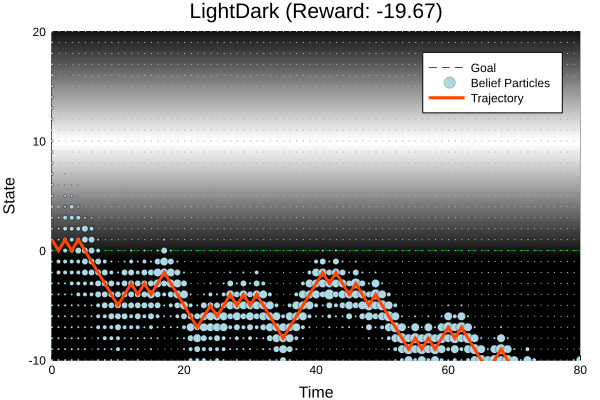

In [4]:
using ParticleFilters
rng = MersenneTwister(7)

p = SimpleLightDark()
pf = SIRParticleFilter(p, 10000, rng=rng)

h = sim(p, updater=pf, initial_state=1, initial_obs=initial_state_distribution(p), max_steps=80, rng=rng) do b
    return rand(rng, [-1,1])
end

plothist(p, h)

In [5]:
using QMDP

solver = QMDPSolver()

policy = solve(solver, p, verbose=true);

[Iteration 1   ] residual:        100 | iteration runtime:      0.084 ms, (  8.41E-05 s total)
[Iteration 2   ] residual:         95 | iteration runtime:      0.040 ms, (  0.000124 s total)
[Iteration 3   ] residual:       90.3 | iteration runtime:      0.029 ms, (  0.000153 s total)
[Iteration 4   ] residual:       85.7 | iteration runtime:      0.026 ms, (  0.000179 s total)
[Iteration 5   ] residual:       81.5 | iteration runtime:      0.026 ms, (  0.000205 s total)
[Iteration 6   ] residual:       77.4 | iteration runtime:      0.026 ms, (  0.000231 s total)
[Iteration 7   ] residual:       73.5 | iteration runtime:      0.026 ms, (  0.000256 s total)
[Iteration 8   ] residual:       8.17 | iteration runtime:      0.026 ms, (  0.000282 s total)
[Iteration 9   ] residual:       3.98 | iteration runtime:      0.026 ms, (  0.000308 s total)
[Iteration 10  ] residual:          0 | iteration runtime:      0.027 ms, (  0.000335 s total)


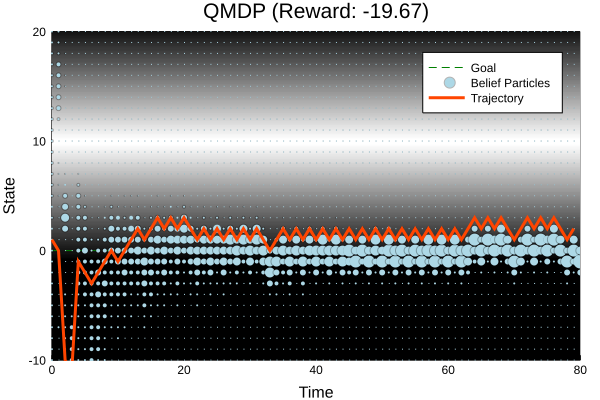

In [6]:
srand(rng, 14)
hr = HistoryRecorder(max_steps=80, initial_state=1)
h = simulate(hr, p, policy, pf)
plothist(p, h, "QMDP")

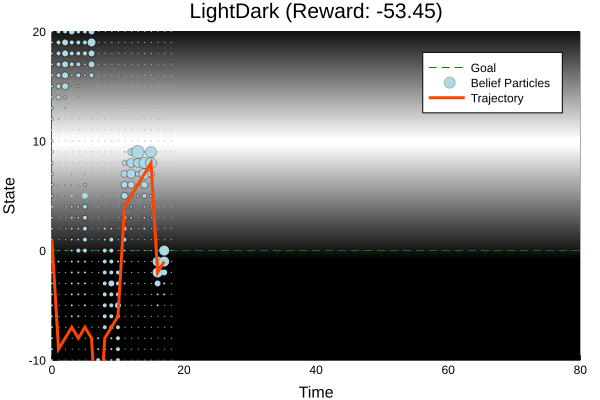

In [16]:
using BasicPOMCP
using DiscreteValueIteration
srand(rng, 7)
max_depth = 20
max_time = 0.01
ro = ValueIterationSolver()
sol = POMCPSolver(max_depth=max_depth,
            max_time=max_time,
            c=100.0,
            tree_queries=typemax(Int),
            # estimate_value=FOValue(ro),
            estimate_value=FORollout(RandomSolver()),
            rng=rng,
            tree_in_info=true
           )

planner = solve(sol, p)
h = simulate(hr, p, planner, pf)
plothist(p, h)

In [17]:
using D3Trees
b = initial_state_distribution(p)
a, i = action_info(planner, b)
D3Tree(i[:tree], init_expand=2)

o: <root>
N: 3659      
├──a: -10
│  N: 902     V: -80.3     
│  ├──o: -12.54489009280581
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -1.7188775463876924
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -19.248635281316602
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 6.360227024784027
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 10.680926187784037
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -6.156763838590518
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 21.413842461370415
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -42.98844419047423
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -66.01899068796945
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 10.000091380858395
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -29.36781539112712
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -

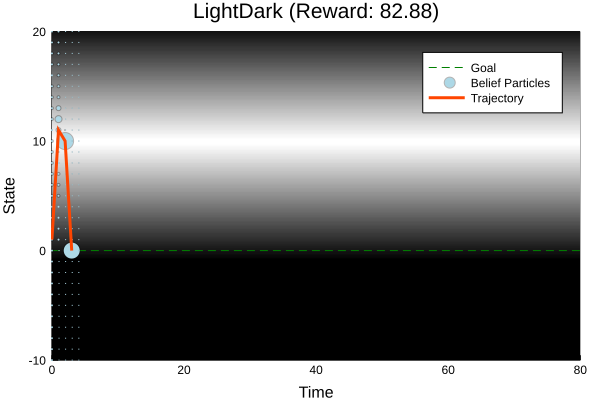

In [18]:
using POMCPOW
srand(rng, 7)
max_time=0.01
sol = POMCPOWSolver(tree_queries=10_000_000,
                       criterion=MaxUCB(90.0),
                       max_depth=max_depth,
                       max_time=max_time,
                       enable_action_pw=false,
                       k_observation=5.0,
                       alpha_observation=1/15.0,
                       # estimate_value=FOValue(ro),
                       estimate_value=FORollout(RandomSolver()),
                       check_repeat_obs=false,
                       tree_in_info=true,
                       rng=rng
                      )

planner = solve(sol, p)
h = simulate(hr, p, planner, pf)
plothist(p, h)

In [19]:
using D3Trees
b = initial_state_distribution(p)
a, i = action_info(planner, b)
D3Tree(i[:tree], init_expand=2)

o: <root>
N: 3359      

├──a: -10
│  N: 218     V: -77.3     
│  ├──o: -32.949815781236325
│  │  N: 25        

│  │  ├──a: -10
│  │  │  N: 4       V: -78.3      (4 children)
│  │  ├──a: -1
│  │  │  N: 4       V: -84.8      (4 children)
│  │  ├──a: 0
│  │  │  N: 3       V: -100       (3 children)
│  │  ├──a: 1
│  │  │  N: 3       V: -91.1      (3 children)
│  │  └──a: 10
│  │     N: 11      V: -47.2      (6 children)
│  ├──o: 22.83434979385669
│  │  N: 28        

│  │  ├──a: -10
│  │  │  N: 6       V: -87.1      (6 children)
│  │  ├──a: -1
│  │  │  N: 6       V: -80.9      (6 children)
│  │  ├──a: 0
│  │  │  N: 4       V: -100       (4 children)
│  │  ├──a: 1
│  │  │  N: 7       V: -76.4      (6 children)
│  │  └──a: 10
│  │     N: 5       V: -91.6      (5 children)
│  ├──o: 10.294371767649192
│  │  N: 29        

│  │  ├──a: -10
│  │  │  N: 6       V: -81        (6 children)
│  │  ├──a: -1
│  │  │  N: 6       V: -82.1      (6 children)
│  │  ├──a: 0
│  │  │  N: 4       V: -100       (4 children)
│  │  ├──a: 1
│  │  │  N: 6       V: -84        (6 children)
│  │  └──a: 10
│  │     N: 7       V: -81.2      (6 children)
│  ├──o: 15.975018289232413
│  │  N: 29        

│  │  ├──a: -10
│  │  │  N: 6       V: -88.9      (6 children)
│  │  ├──a: -1
│  │  │  N: 6       V: -86.8      (6 children)
│  │  ├──a: 0
│  │  │  N: 4       V: -100       (4 children)
│  │  ├──a: 1
│  │  │  N: 7       V: -85.1      (6 children)
│  │  └──a: 10
│  │     N: 6       V: -86        (6 children)
│  ├──o: 23.353923132041512
│  │  N: 40        

│  │  ├──a: -10
│  │  │  N: 9       V: -78.8      (6 children)
│  │  ├──a: -1
│  │  │  N: 8       V: -84.1      (6 children)
│  │  ├──a: 0
│  │  │  N: 5       V: -100       (5 children)
│  │  ├──a: 1
│  │  │  N: 8       V: -82.4      (6 children)
│  │  └──a: 10
│  │     N: 10      V: -77.7      (6 children)
│  ├──o: 8.491116440536882
│  │  N: 31        

│  │  ├──a: -10
│  │  │  N: 5       V: -88.4      (5 children)
│  │  ├──a: -1
│  │  │  N: 5       V: -81.3      (5 children)
│  │  ├──a: 0
│  │  │  N: 3       V: -100       (3 children)
│  │  ├──a: 1
│  │  │  N: 13      V: -49.8      (6 children)
│  │  └──a: 10
│  │     N: 5       V: -84.9      (5 children)
│  ├──o: -0.6711529629554097
│  │  N: 21        

│  │  ├──a: -10
│  │  │  N: 3       V: -86.6      (3 children)
│  │  ├──a: -1
│  │  │  N: 7       V: -58.5      (6 children)
│  │  ├──a: 0
│  │  │  N: 5       V: -60        (5 children)
│  │  ├──a: 1
│  │  │  N: 3       V: -83.8      (3 children)
│  │  └──a: 10
│  │     N: 3       V: -89        (3 children)
│  └──o: -18.923913531405606
│     N: 7         

│     ├──a: -10
│     │  N: 2       V: -80        (2 children)
│     ├──a: -1
│     │  N: 2       V: -86.9      (2 children)
│     ├──a: 0
│     │  N: 1       V: -100       (1 children)
│     ├──a: 1
│     │  N: 1       V: -88.6      (1 children)
│     └──a: 10
│        N: 1       V: -88.6      (1 children)
├──a: -1
│  N: 2770    V: -60.7     
│  ├──o: 10.675176569722488
│  │  N: 322       

│  │  ├──a: -10
│  │  │  N: 61      V: -74        (7 children)
│  │  ├──a: -1
│  │  │  N: 129     V: -65.2      (7 children)
│  │  ├──a: 0
│  │  │  N: 17      V: -100       (7 children)
│  │  ├──a: 1
│  │  │  N: 44      V: -78.9      (7 children)
│  │  └──a: 10
│  │     N: 71      V: -71.7      (7 children)
│  ├──o: 10.545508185046241
│  │  N: 311       

│  │  ├──a: -10
│  │  │  N: 118     V: -70.4      (7 children)
│  │  ├──a: -1
│  │  │  N: 71      V: -76        (7 children)
│  │  ├──a: 0
│  │  │  N: 19      V: -100       (7 children)
│  │  ├──a: 1
│  │  │  N: 54      V: -80        (7 children)
│  │  └──a: 10
│  │     N: 49      V: -81.3      (7 children)
│  ├──o: 31.049944526588252
│  │  N: 330       

│  │  ├──a: -10
│  │  │  N: 60      V: -84.1      (7 children)
│  │  ├──a: -1
│  │  │  N: 103     V: -77.6      (7 children)
│  │  ├──a: 0
│  │  │  N: 25      V: -100       (7 children)
│  │  ├──a: 1
│  │  │  N: 79      V: -80.6      (7 children)
│  │  └──a: 10
│  │    